In [1]:
from astropy.io import fits
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
from scipy.signal import find_peaks

from rascal.calibrator import Calibrator
from rascal.util import refine_peaks

%matplotlib inline

Info: https://www.eso.org/sci/facilities/lasilla/instruments/efosc/inst/Perf_HeAr.html

Manual: https://www.eso.org/sci/facilities/lasilla/instruments/efosc/doc/manual/EFOSC2manual_v4.2.pdf

Grism #11

In [2]:
data = fits.open('data_eso36_efosc/EFOSC_spec_HeAr227_0005.fits')[0]

C:\Users\cylam\AppData\Local\Temp/ipykernel_13584/4101913083.py:2: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(data.data.T), aspect='auto', origin='lower')


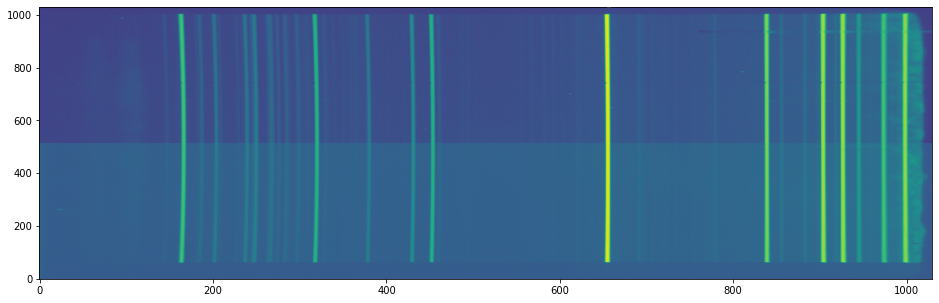

In [3]:
plt.figure(1, figsize=(16,5))
plt.imshow(np.log(data.data.T), aspect='auto', origin='lower')

In [4]:
spectrum = np.median(data.data.T, axis=0)

# Identify the arc lines
peaks, _ = find_peaks(spectrum, prominence=200, distance=10, threshold=None)
peaks_refined = refine_peaks(spectrum, peaks, window_width=3)

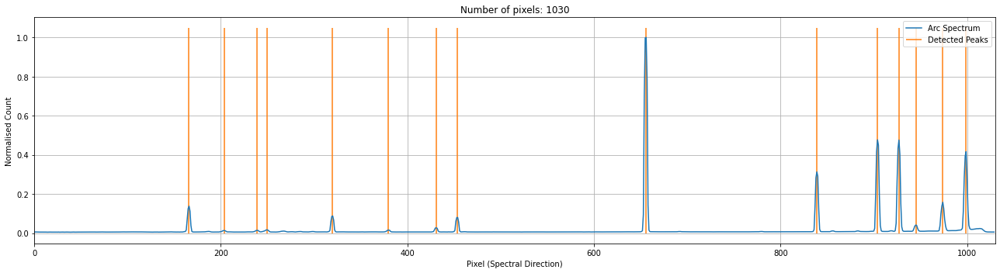

In [5]:

c = Calibrator(peaks_refined, spectrum)
c.set_calibrator_properties(num_pix=len(spectrum),
                            plotting_library='matplotlib',
                            log_level='info')

c.plot_arc()

In [6]:
c.use_plotly()
c.plot_arc(renderer='notebook')
c.use_matplotlib()

In [7]:
c.set_known_pairs(998.53393246, 7053.9)
c.set_hough_properties(num_slopes=5000,
                       range_tolerance=500.,
                       xbins=100,
                       ybins=100,
                       min_wavelength=3500.,
                       max_wavelength=7500.)
c.set_ransac_properties(sample_size=5, top_n_candidate=5)
c.add_atlas(["He"])
c.add_atlas(["Ar"], min_intensity=100)
c.do_hough_transform()

Most inliers: 8, best error: 0.3752: 100%|██████████| 1000/1000 [00:13<00:00, 74.15it/s]
c:\users\cylam\git\rascal\rascal\calibrator.py:2929: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



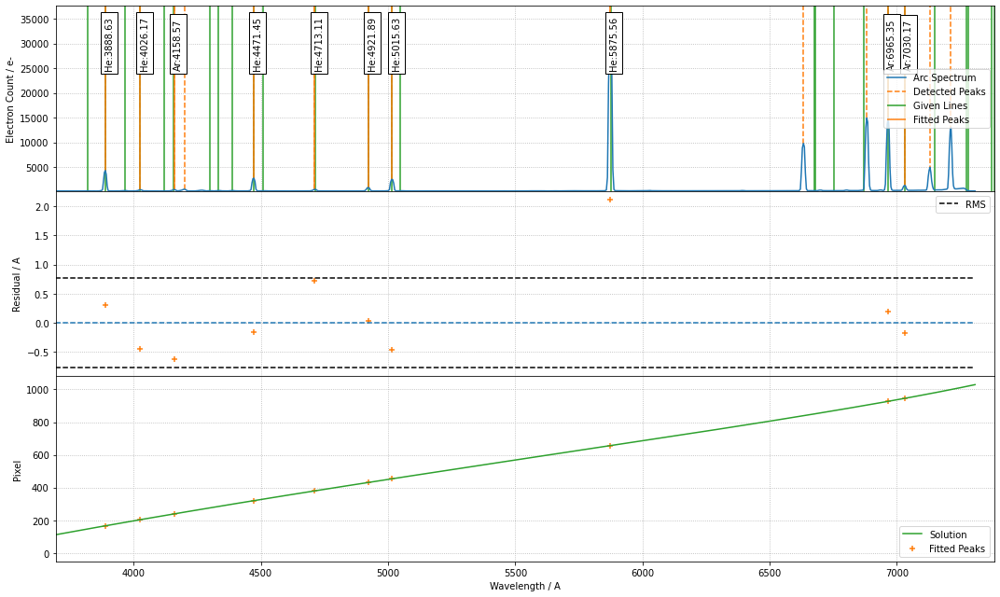

In [8]:
# Run the wavelength calibration
(best_p, matched_peaks, matched_atlas, rms, residual, peak_utilisation,
 atlas_utilisation) = c.fit(max_tries=1000)

c.plot_fit(best_p, plot_atlas=True, log_spectrum=False, tolerance=5.0)

In [9]:
c.use_plotly()
c.plot_fit(best_p, plot_atlas=True, log_spectrum=False, tolerance=5.0, renderer='notebook')
c.use_matplotlib()

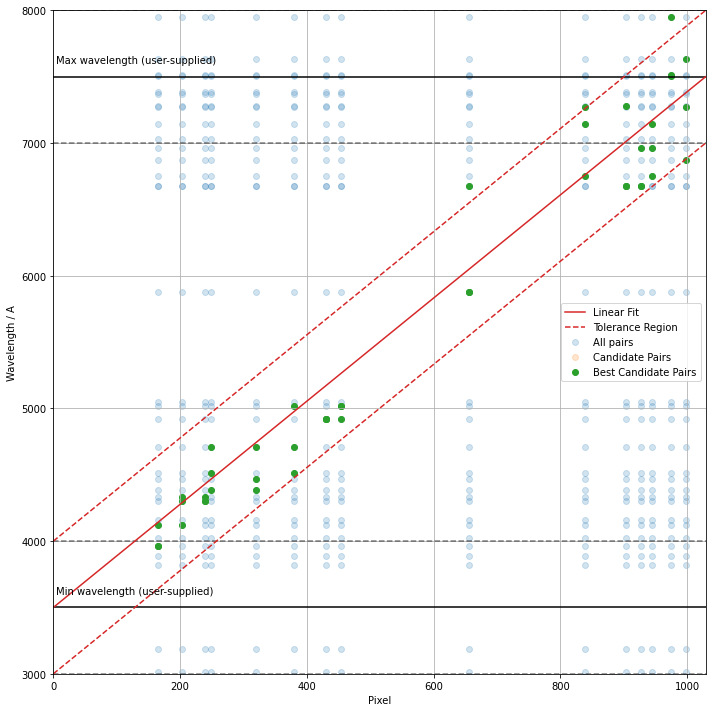

In [10]:
c.plot_search_space()

In [11]:
c.use_plotly()
c.plot_search_space(renderer='notebook')

In [12]:
print("Stdev error: {} A".format(np.abs(residual).std()))
print("Peaks utilisation rate: {}%".format(peak_utilisation * 100))
print("Atlas utilisation rate: {}%".format(atlas_utilisation * 100))

Stdev error: 0.20909210902358438 A
Peaks utilisation rate: 53.333333333333336%
Atlas utilisation rate: 24.242424242424242%
